Ioannis Dardavesis:5372666
Theodoros Papakostas:5287928

In this assignment we tried to implement in a python program the classification of a Sentinel 2 image. The data given was a satellite image for the area around Delft on 30/5/2020 in three resolutions.(10m,20m,60m). We had to classify two resolutions: the whole 60m image and a subset of the 10m one.

The 60m image consists of 11 different bands(B1-B12,B10 excluded) which we chose to import. We used rasterio library,in order to import and read the bands' datasets and scikit learn library to perform the classification. The method that was used was the k-means clustering.

In [43]:
import rasterio 
from rasterio.plot import show
from sklearn import cluster
import matplotlib.pyplot as plt
import numpy as np
# Open the images
B1 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B01_60m.jp2')
B2 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B02_60m.jp2')
B3 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B03_60m.jp2')
B4 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B04_60m.jp2')
B5 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B05_60m.jp2')
B6 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B06_60m.jp2')
B7 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B07_60m.jp2')
B8 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B8A_60m.jp2')
B9 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B09_60m.jp2')
B11 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B11_60m.jp2')
B12 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R60m/T31UET_20200530T105031_B12_60m.jp2')
print(B2.meta,B3.meta,B4.meta,B8.meta)

{&#39;driver&#39;: &#39;JP2OpenJPEG&#39;, &#39;dtype&#39;: &#39;uint16&#39;, &#39;nodata&#39;: None, &#39;width&#39;: 1830, &#39;height&#39;: 1830, &#39;count&#39;: 1, &#39;crs&#39;: CRS.from_epsg(32631), &#39;transform&#39;: Affine(60.0, 0.0, 499980.0,
       0.0, -60.0, 5800020.0)} {&#39;driver&#39;: &#39;JP2OpenJPEG&#39;, &#39;dtype&#39;: &#39;uint16&#39;, &#39;nodata&#39;: None, &#39;width&#39;: 1830, &#39;height&#39;: 1830, &#39;count&#39;: 1, &#39;crs&#39;: CRS.from_epsg(32631), &#39;transform&#39;: Affine(60.0, 0.0, 499980.0,
       0.0, -60.0, 5800020.0)} {&#39;driver&#39;: &#39;JP2OpenJPEG&#39;, &#39;dtype&#39;: &#39;uint16&#39;, &#39;nodata&#39;: None, &#39;width&#39;: 1830, &#39;height&#39;: 1830, &#39;count&#39;: 1, &#39;crs&#39;: CRS.from_epsg(32631), &#39;transform&#39;: Affine(60.0, 0.0, 499980.0,
       0.0, -60.0, 5800020.0)} {&#39;driver&#39;: &#39;JP2OpenJPEG&#39;, &#39;dtype&#39;: &#39;uint16&#39;, &#39;nodata&#39;: None, &#39;width&#39;: 1830, &#39;height&#39;: 183

Files import and print of metadata to check the bands' data characteristics.

In [44]:
img_B1 = np.empty((B1.height, B1.width, B1.count), B1.meta['dtype']) 
img_B2 = np.empty((B2.height, B2.width, B2.count), B2.meta['dtype']) 
img_B3 = np.empty((B3.height, B3.width, B3.count), B3.meta['dtype']) 
img_B4 = np.empty((B4.height, B4.width, B4.count), B4.meta['dtype'])
img_B5 = np.empty((B5.height, B5.width, B5.count), B5.meta['dtype'])
img_B6 = np.empty((B6.height, B6.width, B6.count), B6.meta['dtype'])
img_B7 = np.empty((B7.height, B7.width, B7.count), B7.meta['dtype'])
img_B8 = np.empty((B8.height, B8.width, B8.count), B8.meta['dtype']) 
img_B9 = np.empty((B9.height, B9.width, B9.count), B9.meta['dtype'])
img_B11 = np.empty((B11.height, B11.width, B11.count), B11.meta['dtype'])
img_B12 = np.empty((B12.height, B12.width, B12.count), B12.meta['dtype'])
for band in range(img_B2.shape[2]):
    img_B1[:,:,band] = B1.read(band+1)
    img_B2[:,:,band] = B2.read(band+1)
    img_B3[:,:,band] = B3.read(band+1)
    img_B4[:,:,band] = B4.read(band+1)
    img_B5[:,:,band] = B5.read(band+1)
    img_B6[:,:,band] = B6.read(band+1)
    img_B7[:,:,band] = B7.read(band+1)
    img_B8[:,:,band] = B8.read(band+1)
    img_B9[:,:,band] = B9.read(band+1)
    img_B11[:,:,band] = B11.read(band+1)
    img_B12[:,:,band] = B12.read(band+1)
rgb = np.dstack((img_B2,img_B3,img_B4))
rgbNIR = np.dstack((img_B2,img_B3,img_B4,img_B8))
bands12348 = np.dstack((img_B2,img_B3,img_B4,img_B8,img_B1))
bandsALL = np.dstack((img_B2,img_B3,img_B4,img_B8,img_B1,img_B11,img_B12,img_B5,img_B6,img_B7,img_B9))

In the beginning, using numpy library we generated empty arrays for each image band that we imported. Then, we created a loop, in order to fill the arrays with the proper data. Thus, now we had to choose the appropriate band combinations, in order to get the best possible visualisation of the classified data. In general, the expected result is supposed to be a map of discrete landcover use areas. For this reason, we tried various band combinations to perfectly render the landuses we noticed in the given area. These are the following : Water, cultivated areas, urban areas and plain fields. Regarding that we deal with 60m resolution and a vast survey area, we don't expect a  product, with great detail in terms of visualisation. Finally, we used dstack attribute, to append the bands in a single array. The band combinations we used are: RGB,RGB+NIR,RGB+NIR+Coastal Aerosol and last but not least, we also combined all the bands at the same time. 

In [45]:
rgb_1d=rgb[:,:,:3].reshape((rgb.shape[0]*rgb.shape[1],rgb.shape[2]))
rgbNIR_1d=rgbNIR[:,:,:4].reshape((rgbNIR.shape[0]*rgbNIR.shape[1],rgbNIR.shape[2]))
bands12348_1d=bands12348[:,:,:5].reshape((bands12348.shape[0]*bands12348.shape[1],bands12348.shape[2]))
bandsALL_1d=bandsALL[:,:,:12].reshape((bandsALL.shape[0]*bandsALL.shape[1],bandsALL.shape[2]))
print(bandsALL_1d.shape)
print(rgb_1d.shape)
print(rgbNIR_1d.shape)
print(bands12348_1d.shape)

(3348900, 11)
(3348900, 3)
(3348900, 4)
(3348900, 5)


In order to be able to train the k-means classifier,  we converted X and Y dimensions to one dimension, so to have a 2d array(1D,bands).

As cited above, the landcover uses-clusters we expect in general are 3-4. We experimented with different numbers of clusters, so to conclude to the best possible visual products. Our goal was to get the best possible product, by means of visualisation and computer processing.

RGB combination

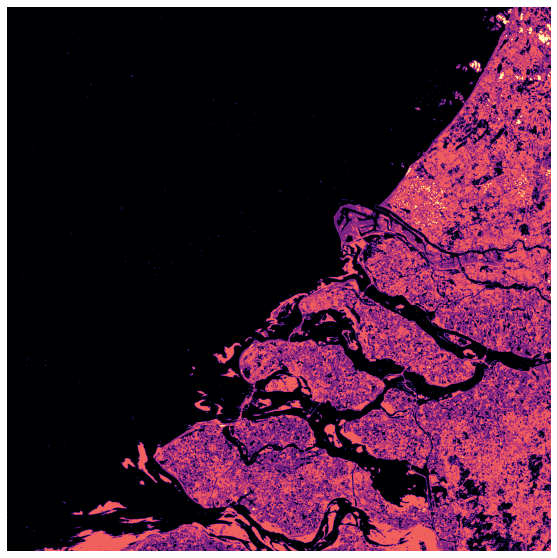

In [46]:
cl = cluster.KMeans(n_clusters=4) # create an object of the classifier
param = cl.fit(rgb_1d) # train it
img_cl = cl.labels_ # get the labels of the classes
img_cl = img_cl.reshape(rgb[:,:,0].shape) # reshape labels to a 3d array (one band only)
plt.figure(figsize=(10,10))
plt.imshow(img_cl, cmap='magma')
plt.axis('off')
plt.savefig("rgb_clustered4.jpg", bbox_inches='tight')
plt.show()

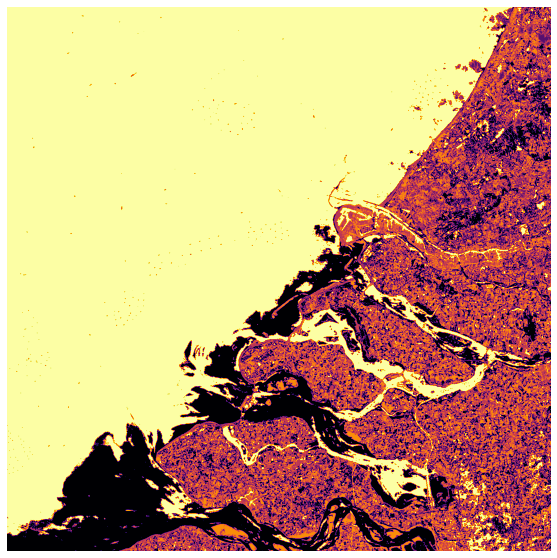

In [47]:
cl = cluster.KMeans(n_clusters=5) # create an object of the classifier
param = cl.fit(rgb_1d) # train it
img_cl = cl.labels_ # get the labels of the classes
img_cl = img_cl.reshape(rgb[:,:,0].shape) # reshape labels to a 3d array (one band only)
plt.figure(figsize=(20,10))
plt.imshow(img_cl, cmap='inferno')
plt.axis('off')
plt.savefig("rgb_clustered5.jpg", bbox_inches='tight')
plt.show()

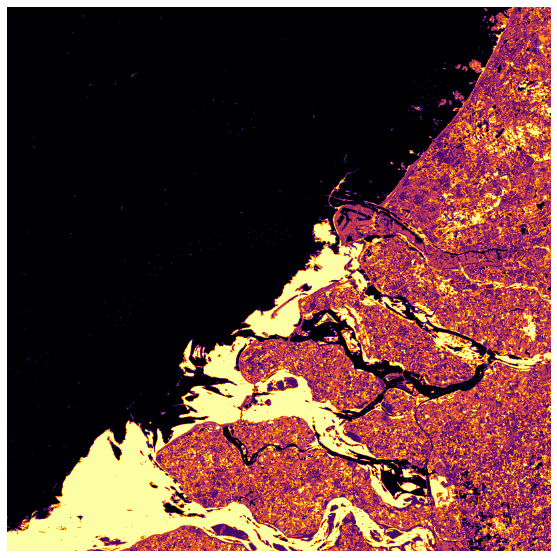

In [48]:
cl = cluster.KMeans(n_clusters=6) # create an object of the classifier
param = cl.fit(rgb_1d) # train it
img_cl = cl.labels_ # get the labels of the classes
img_cl = img_cl.reshape(rgb[:,:,0].shape) # reshape labels to a 3d array (one band only)
plt.figure(figsize=(20,10))
plt.imshow(img_cl, cmap='inferno')
plt.axis('off')
plt.savefig("rgb_clustered5.jpg", bbox_inches='tight')
plt.show()

First of all, on the RGB combination, we ran the k-means for 4,5 and 6 clusters. The 4-cluster product discriminates ground and water well enough, but it complicates the distinction of ground land cover uses. Next, regarding the 5 and 6 cluster products, while the land cover uses continue to elapse with ambiguity, the water values tend to become worse. As a result the final product is still not acceptable and even worse than the 4-clusters result. For this reason, we proceeded to a different bands' combination. 

RGB + NIR combination

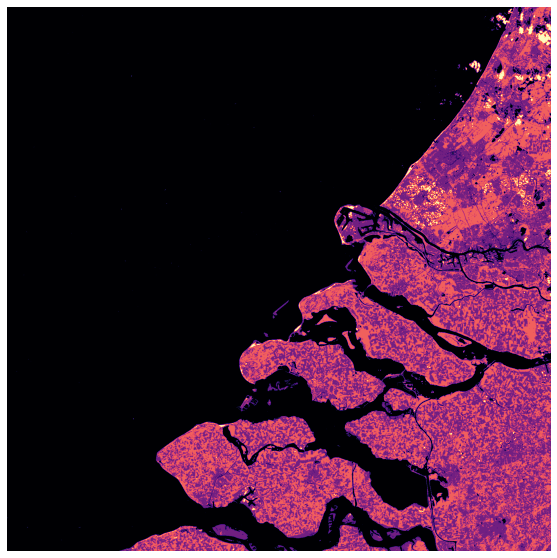

In [49]:
cl = cluster.KMeans(n_clusters=4) # create an object of the classifier
param = cl.fit(rgbNIR_1d) # train it
img_cl = cl.labels_ # get the labels of the classes
img_cl = img_cl.reshape(rgbNIR[:,:,0].shape) # reshape labels to a 3d array (one band only)
plt.figure(figsize=(20,10))
plt.imshow(img_cl, cmap='magma')
plt.axis('off')
plt.savefig("rgbNIR_clustered4.jpg", bbox_inches='tight')
plt.show()

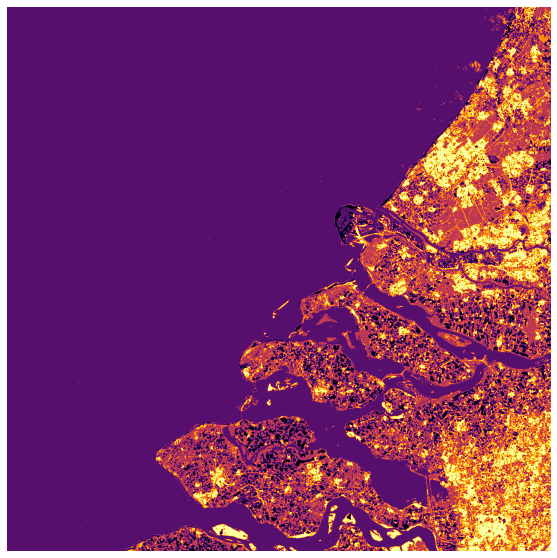

In [50]:
cl = cluster.KMeans(n_clusters=5) # create an object of the classifier
param = cl.fit(rgbNIR_1d) # train it
img_cl = cl.labels_ # get the labels of the classes
img_cl = img_cl.reshape(rgbNIR[:,:,0].shape) # reshape labels to a 3d array (one band only)
plt.figure(figsize=(20,10))
plt.imshow(img_cl, cmap='inferno')
plt.axis('off')
plt.savefig("rgbNIR_clustered5.jpg", bbox_inches='tight')
plt.show()

In general terms there are not major differences to the previous combination, however the water values are demonstrated in greater detail (ex. The rivers are well formed) and they do not become worse, while we augment the number of clusters. In the 5-cluster product, some generic land cover use conclusions can be derived (eg. Some urban and rural areas, are distinguished). We proceed to the next combination.

RGB+NIR+Coastal Aerosol combination
(We chose the Coastal Aerosol Band 1, since it is useful for imaging shallow water. We used it to fix the problems we faced, towards the water visualisation accuracy.)

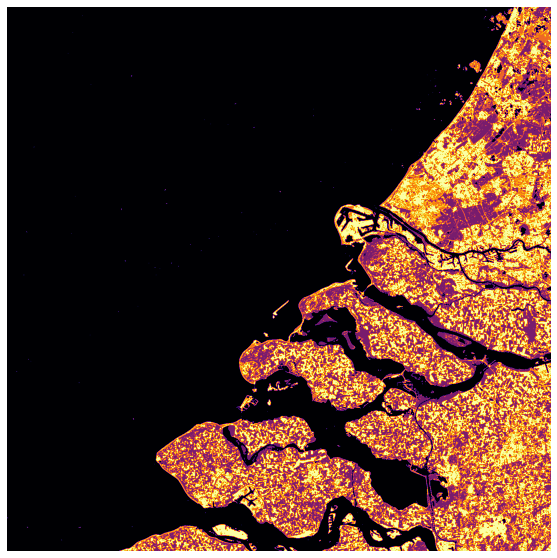

In [51]:
cl = cluster.KMeans(n_clusters=4) # create an object of the classifier
param = cl.fit(bands12348_1d) # train it
img_cl = cl.labels_ # get the labels of the classes
img_cl = img_cl.reshape(bands12348[:,:,0].shape) # reshape labels to a 3d array (one band only)
plt.figure(figsize=(20,10))
plt.imshow(img_cl, cmap='inferno')
plt.axis('off')
plt.savefig("bands12348_clustered4.jpg", bbox_inches='tight')
plt.show()

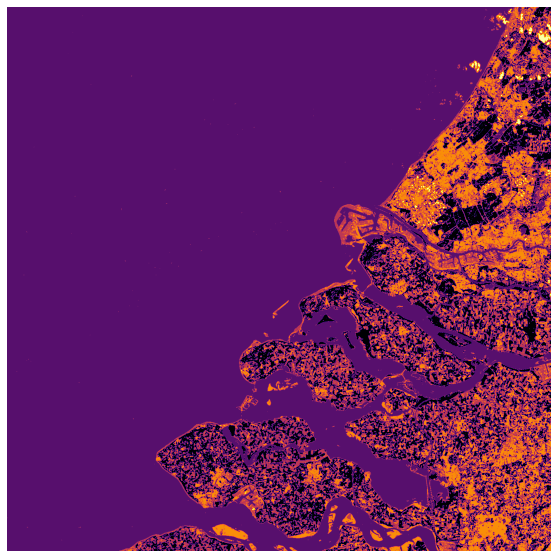

In [52]:
cl = cluster.KMeans(n_clusters=5) # create an object of the classifier
param = cl.fit(bands12348_1d) # train it
img_cl = cl.labels_ # get the labels of the classes
img_cl = img_cl.reshape(bands12348[:,:,0].shape) # reshape labels to a 3d array (one band only)
plt.figure(figsize=(20,10))
plt.imshow(img_cl, cmap='inferno')
plt.axis('off')
plt.savefig("bands12348_clustered5.jpg", bbox_inches='tight')
plt.show()

We notice that in the 4-cluster image, while the water areas are defined in great detail and although some urban areas are slighly distinguished, the result is still not enough. In the 5-cluster product we finally get some significant results. The water areas seem well formed and by now it is easier to distinguish some basic urban areas, like Den Haag, Rotterdam and possibly Breda in the Southeast. Furthermore, the rural areas are also visible and conclusions over their usage can be derived, such as the greenhouses Southwest of Den Haag.

11 Band combination

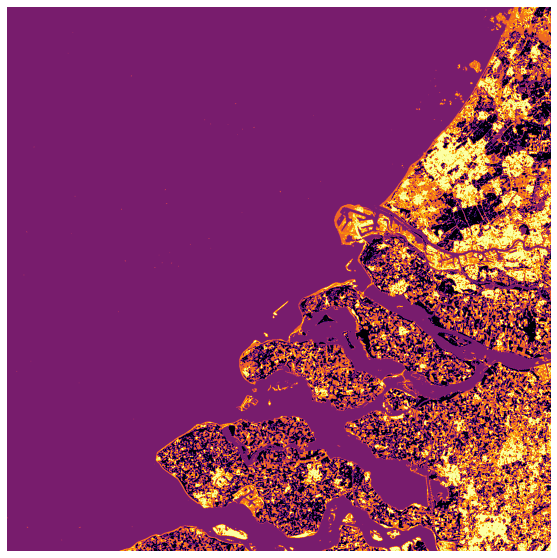

In [53]:
cl = cluster.KMeans(n_clusters=4) # create an object of the classifier
param = cl.fit(bandsALL_1d) # train it
img_cl = cl.labels_ # get the labels of the classes
img_cl = img_cl.reshape(bandsALL[:,:,0].shape) # reshape labels to a 3d array (one band only)
plt.figure(figsize=(20,10))
plt.imshow(img_cl, cmap='inferno')
plt.axis('off')
plt.savefig("bandsALL_clustered3.jpg", bbox_inches='tight')
plt.show()

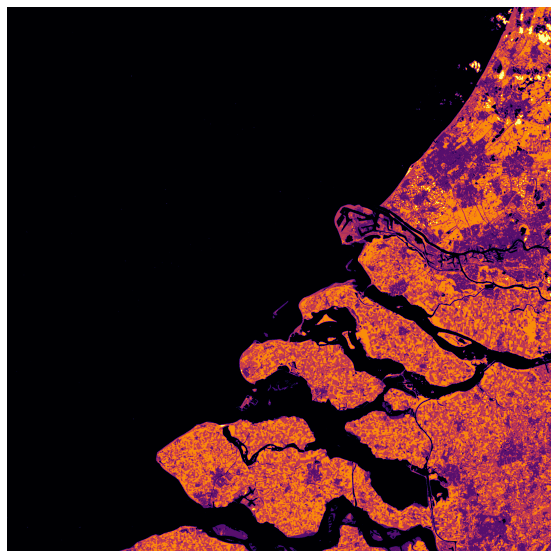

In [54]:
cl = cluster.KMeans(n_clusters=5) # create an object of the classifier
param = cl.fit(bandsALL_1d) # train it
img_cl = cl.labels_ # get the labels of the classes
img_cl = img_cl.reshape(bandsALL[:,:,0].shape) # reshape labels to a 3d array (one band only)
plt.figure(figsize=(20,10))
plt.imshow(img_cl, cmap='inferno')
plt.axis('off')
plt.savefig("bandsALL_clustered3.jpg", bbox_inches='tight')
plt.show()

As we observe using the full bands' combination, the results we get are robust in terms of visualisation. The final product provides a satisfactory map of discrete landcover uses.  However, due to the augmentation in terms of computer processing, we tend to conclude that the best solution is the one provided by the combination of RGB, NIR and Coastal aerosol with 5 clusters. That is because this solution is equally adequate and the extra detail is not essential, in order to obtain the same conclusions.

For the second part of the assignment we classified a subset of the 10m resolution image, using the k-means clustering method again. We chose to import the bands that provided the best result in the previous section. The subset we had to classify is a "window" (height=500,width=700), whose top left corner is the pixel containing the coordinate (X=601200.0,Y=5773695.0). We generated this "window" using the rasterio windowed functions. Regarding the coding, the same procedures with before were followed.

In [55]:
from rasterio.windows import from_bounds
from rasterio.windows import Window
B1 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R10m/T31UET_20200530T105031_AOT_10m.jp2')
B2 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R10m/T31UET_20200530T105031_B02_10m.jp2')
B3 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R10m/T31UET_20200530T105031_B03_10m.jp2')
B4 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R10m/T31UET_20200530T105031_B04_10m.jp2')
B8 = rasterio.open('../GRANULE/L2A_T31UET_A025788_20200530T105134/IMG_DATA/R10m/T31UET_20200530T105031_B08_10m.jp2')
row,col = B2.index(601200.0,5773695.0)
Win = Window(col,row,700,500)
B1win=B2.read(1,window=Win)
B2win=B2.read(1,window=Win)
B3win=B3.read(1,window=Win)
B4win=B4.read(1,window=Win)
B8win=B8.read(1,window=Win)

In [56]:
img_B1 = np.empty((500,700,1)) #Coastal Aerosol
img_B2 = np.empty((500,700,1)) #Blue
img_B3 = np.empty((500,700,1)) #Green
img_B4 = np.empty((500,700,1)) #Red
img_B8 = np.empty((500,700,1)) # Narrow NIR
for band in range(img_B2.shape[2]):
    img_B1[:,:,band] = B1win
    img_B2[:,:,band] = B2win
    img_B3[:,:,band] = B3win
    img_B4[:,:,band] = B4win
    img_B8[:,:,band] = B8win
rgb = np.dstack((img_B2,img_B3,img_B4))
rgbNIR = np.dstack((img_B2,img_B3,img_B4,img_B8))
bands12348 = np.dstack((img_B2,img_B3,img_B4,img_B8,img_B1))

The combinations used were: RGB,RGB+NIR and RGB+NIR+Coastal Aerosol

In [57]:
rgb_1d=rgb[:,:,:3].reshape((rgb.shape[0]*rgb.shape[1],rgb.shape[2]))
rgbNIR_1d=rgbNIR[:,:,:4].reshape((rgbNIR.shape[0]*rgbNIR.shape[1],rgbNIR.shape[2]))
bands12348_1d=bands12348[:,:,:5].reshape((bands12348.shape[0]*bands12348.shape[1],bands12348.shape[2]))
print(rgb_1d.shape)
print(rgbNIR_1d.shape)
print(bands12348_1d.shape)

(350000, 3)
(350000, 4)
(350000, 5)


Due to the fact that, we had to classify a 10m resolution image subset, we expect more detailed results,as more landcover uses will be observed. Thus, we chose to deal with a greater number of clusters (7 and 9), after experimenting with lower ones which led to more complicated results.

The given subset is an area consisted of three basic landcover uses: An urban area, fields and some water areas, (possibly rivers and ponds). These can be discriminated in all the following band combinations for 7 and 9 clusters. Consequently, the decision will be based on the map that gives the best possible detail and simultaneously the distinct visualisation of the landcover uses.

RGB combination

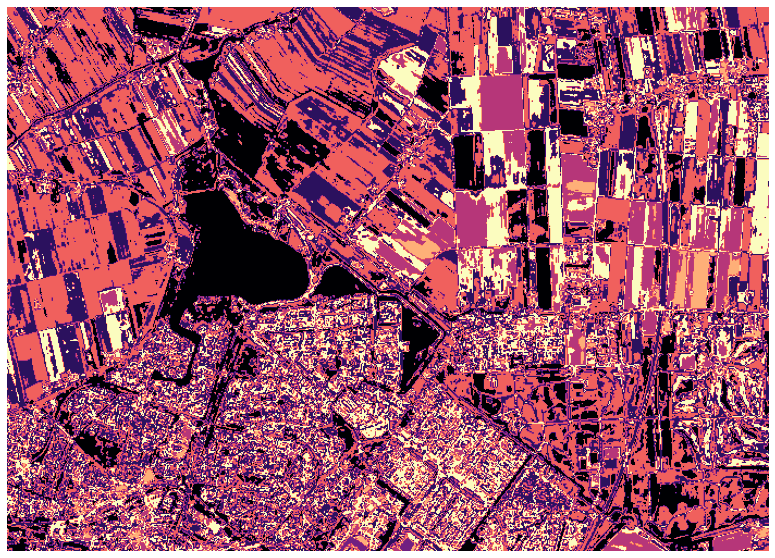

In [58]:
cl = cluster.KMeans(n_clusters=7) # create an object of the classifier
param = cl.fit(rgb_1d) # train it
img_cl = cl.labels_ # get the labels of the classes
img_cl = img_cl.reshape(rgb[:,:,0].shape) # reshape labels to a 3d array (one band only)
plt.figure(figsize=(20,10))
plt.imshow(img_cl, cmap='magma')
plt.axis('off')
plt.savefig("rgb_clustered7_win.jpg", bbox_inches='tight')
plt.show()

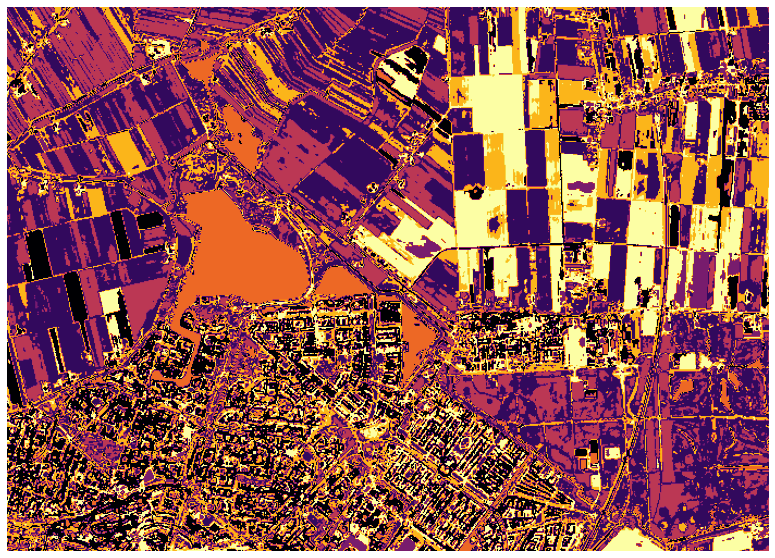

In [59]:
cl = cluster.KMeans(n_clusters=7) # create an object of the classifier
param = cl.fit(rgbNIR_1d) # train it
img_cl = cl.labels_ # get the labels of the classes
img_cl = img_cl.reshape(rgbNIR[:,:,0].shape) # reshape labels to a 3d array (one band only)
plt.figure(figsize=(20,10))
plt.imshow(img_cl, cmap='inferno')
plt.axis('off')
plt.savefig("rgbNIR_clustered7_win.jpg", bbox_inches='tight')
plt.show()

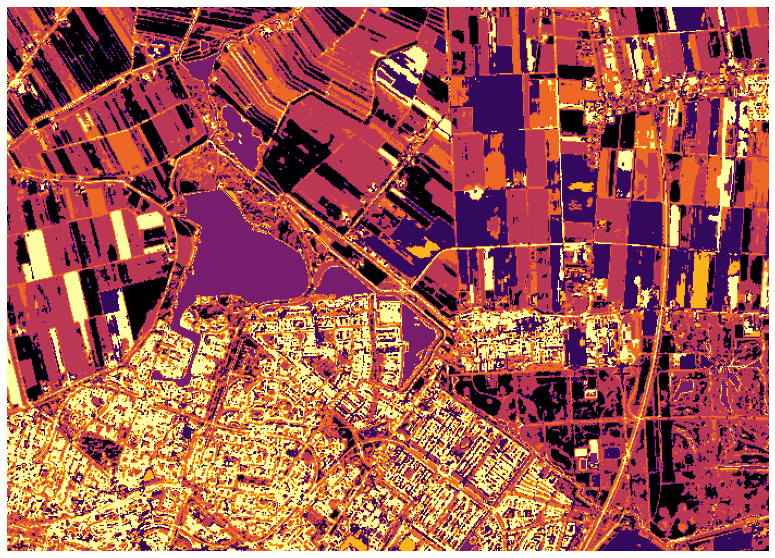

In [60]:
cl = cluster.KMeans(n_clusters=7) # create an object of the classifier
param = cl.fit(bands12348_1d) # train it
img_cl = cl.labels_ # get the labels of the classes
img_cl = img_cl.reshape(bands12348[:,:,0].shape) # reshape labels to a 3d array (one band only)
plt.figure(figsize=(20,10))
plt.imshow(img_cl, cmap='inferno')
plt.axis('off')
plt.savefig("bands12348_clustered7_win.jpg", bbox_inches='tight')
plt.show()

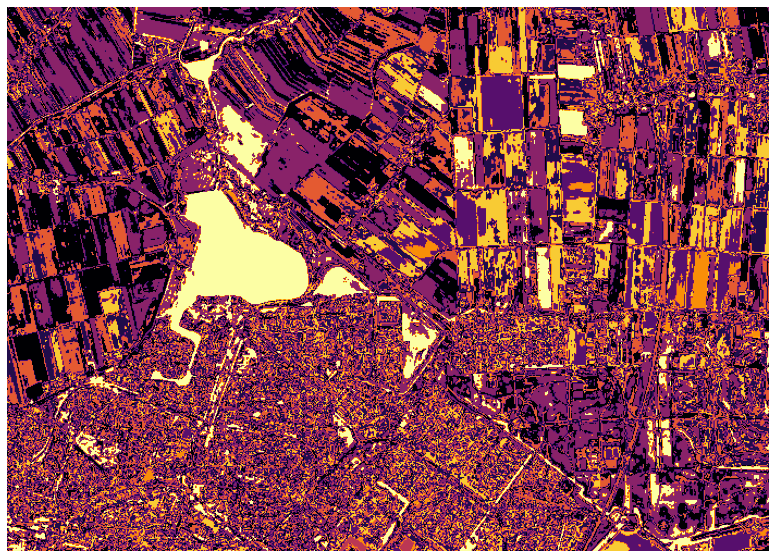

In [61]:
cl = cluster.KMeans(n_clusters=9) # create an object of the classifier
param = cl.fit(rgb_1d) # train it
img_cl = cl.labels_ # get the labels of the classes
img_cl = img_cl.reshape(rgb[:,:,0].shape) # reshape labels to a 3d array (one band only)
plt.figure(figsize=(20,10))
plt.imshow(img_cl, cmap='inferno')
plt.axis('off')
plt.savefig("rgb_clustered9_win.jpg", bbox_inches='tight')
plt.show()

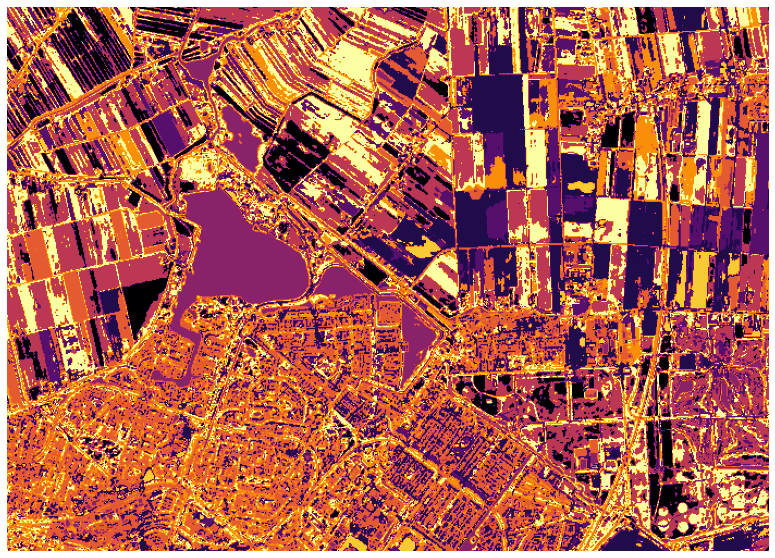

In [62]:
cl = cluster.KMeans(n_clusters=9) # create an object of the classifier
param = cl.fit(rgbNIR_1d) # train it
img_cl = cl.labels_ # get the labels of the classes
img_cl = img_cl.reshape(rgbNIR[:,:,0].shape) # reshape labels to a 3d array (one band only)
plt.figure(figsize=(20,10))
plt.imshow(img_cl, cmap='inferno')
plt.axis('off')
plt.savefig("rgbNIR_clustered9_win.jpg", bbox_inches='tight')
plt.show()

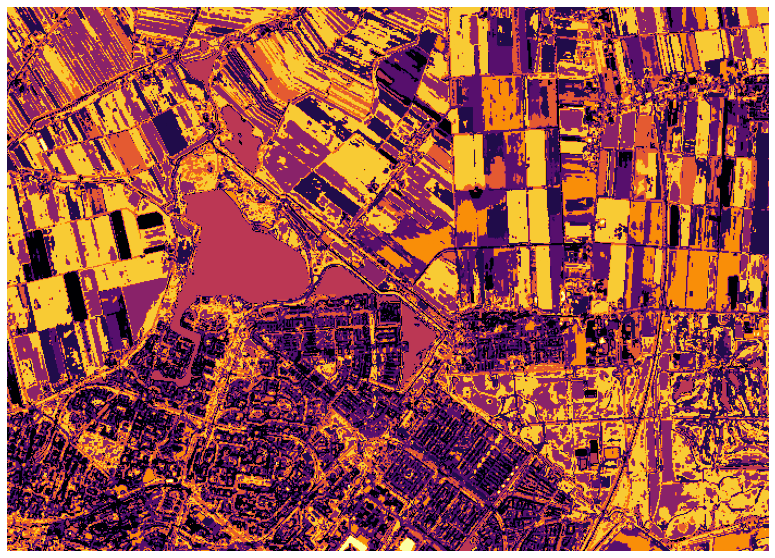

In [63]:
cl = cluster.KMeans(n_clusters=9) # create an object of the classifier
param = cl.fit(bands12348_1d) # train it
img_cl = cl.labels_ # get the labels of the classes
img_cl = img_cl.reshape(bands12348[:,:,0].shape) # reshape labels to a 3d array (one band only)
plt.figure(figsize=(20,10))
plt.imshow(img_cl, cmap='inferno')
plt.axis('off')
plt.savefig("bands12348_clustered9_win.jpg", bbox_inches='tight')
plt.show()

As observed in all the above combinations, the 7-cluster products capture really well the basic urban area, while they have some drawbacks, concerning the fields and the water areas. This amount of clusters is not adequately discriminating those two. There is ambiguity concerning their boundaries. This improves, while implementing 9-clusters. The results are now more clear and the thresholds between the landuses are visually defined. In general, the 9-cluster (RGB+NIR+Coastal Aerosol) combination, as observed above, provides the most comprehensive visual product. 